# GCM 2040-2100 EXTREME VALUE ANALYSIS 

1) Notebook environment to Perform EVA on using 8 GCM Data at both mid and end century horizons and both high and low emmision scenarios using GEV formula
2) This will result in 4 final global hazard maps

In [1]:
# pip install --upgrade scipy

In [1]:
import pystac_client
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from itertools import compress
import pandas as pd
import scipy.stats

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
import plotly.graph_objects as go
import plotly.express as px
import os
import math

from tqdm import tqdm
from scipy.stats import genextreme


In [3]:
Annual_max_30yrs=xr.open_zarr(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_wave_height\ERA5 Nearshore Mapping\STEP 3- Bias Correcting Annual Mean\Mid_Century_Ann_Max_Corrected_GCM.zarr")
Annual_max_30yrs

<xarray.Dataset>
Dimensions:             (time: 32, latitude: 361, longitude: 720)
Coordinates:
  * latitude            (latitude) float32 -90.0 -89.5 -89.0 ... 89.0 89.5 90.0
  * longitude           (longitude) float32 0.0 0.5 1.0 ... 358.5 359.0 359.5
  * time                (time) datetime64[ns] 2040-12-31 ... 2071-12-31
Data variables:
    hs_1_26_ACCESS_CM2  (time, latitude, longitude) float32 dask.array<chunksize=(1, 181, 360), meta=np.ndarray>
    hs_1_26_EC_EARTH3   (time, latitude, longitude) float32 dask.array<chunksize=(1, 181, 360), meta=np.ndarray>
    hs_5_85_ACCESS_CM2  (time, latitude, longitude) float32 dask.array<chunksize=(1, 181, 360), meta=np.ndarray>
    hs_5_85_EC_EARTH3   (time, latitude, longitude) float32 dask.array<chunksize=(1, 181, 360), meta=np.ndarray>
Attributes: (12/36)
    AUTHOR:                        Commonwealth Scientific and Industrial Res...
    CITATION:                      CSIRO. (Year).  2040-2100 CMIP6 EC-EARTH S...
    COMMENT:                       The dataset includes significant wave heig...
    CRS:                           EPSG:4326
    Conventions:                   CF-1.8
    DESCRIPTION:                   The dataset contains projections of signif...
    ...                            ...
    northernmost_latitude:         90.
    product_name:                  ww3.204001_hs.nc
    southernmost_latitude:         -90.
    start_date:                    2040-01-01 00:00:00
    stop_date:                     2040-01-31 21:00:00
    westernmost_longitude:         0.

In [4]:
def reverse_longitude_converter(lon):
    if lon > 180:
        lon = lon - 360
    else:
        lon = lon
    return lon

### Mid century scenarios plot and End of century scenarios plot

In [5]:
Annual_max_30yrs_all=[]
Annual_max_mid_century_30yrs=xr.open_zarr(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_wave_height\ERA5 Nearshore Mapping\STEP 3- Bias Correcting Annual Mean\Mid_Century_Ann_Max_Corrected_GCM.zarr")
Annual_max_30yrs_all.append(Annual_max_mid_century_30yrs)
Annual_max_end_century_30yrs=xr.open_zarr(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_wave_height\ERA5 Nearshore Mapping\STEP 3- Bias Correcting Annual Mean\End_Century_Ann_Max_Corrected_GCM.zarr")
Annual_max_30yrs_all.append(Annual_max_end_century_30yrs)
Annual_max_30yrs_all

[<xarray.Dataset>
 Dimensions:             (time: 32, latitude: 361, longitude: 720)
 Coordinates:
   * latitude            (latitude) float32 -90.0 -89.5 -89.0 ... 89.0 89.5 90.0
   * longitude           (longitude) float32 0.0 0.5 1.0 ... 358.5 359.0 359.5
   * time                (time) datetime64[ns] 2040-12-31 ... 2071-12-31
 Data variables:
     hs_1_26_ACCESS_CM2  (time, latitude, longitude) float32 dask.array<chunksize=(1, 181, 360), meta=np.ndarray>
     hs_1_26_EC_EARTH3   (time, latitude, longitude) float32 dask.array<chunksize=(1, 181, 360), meta=np.ndarray>
     hs_5_85_ACCESS_CM2  (time, latitude, longitude) float32 dask.array<chunksize=(1, 181, 360), meta=np.ndarray>
     hs_5_85_EC_EARTH3   (time, latitude, longitude) float32 dask.array<chunksize=(1, 181, 360), meta=np.ndarray>
 Attributes: (12/36)
     AUTHOR:                        Commonwealth Scientific and Industrial Res...
     CITATION:                      CSIRO. (Year).  2040-2100 CMIP6 EC-EARTH S...
     COMME

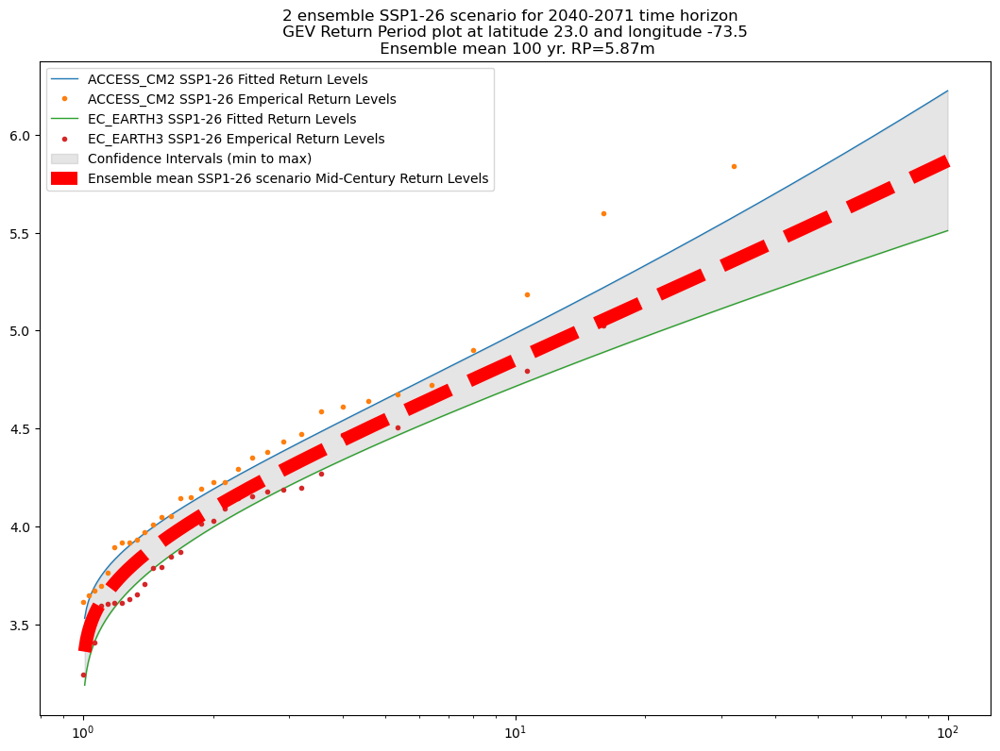

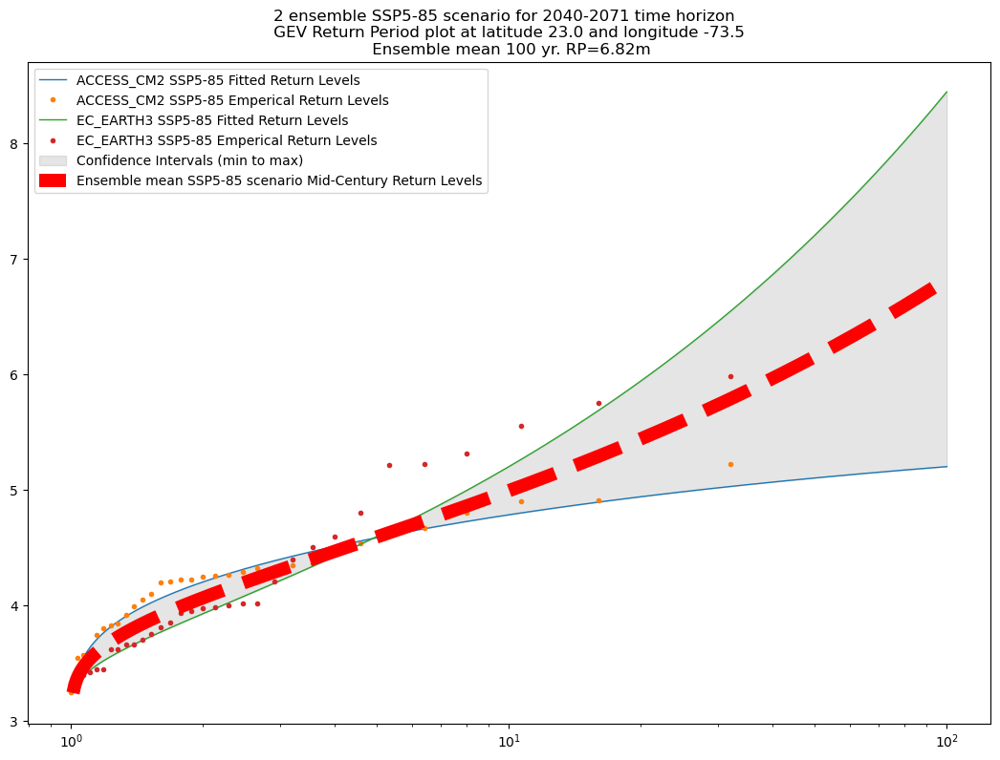

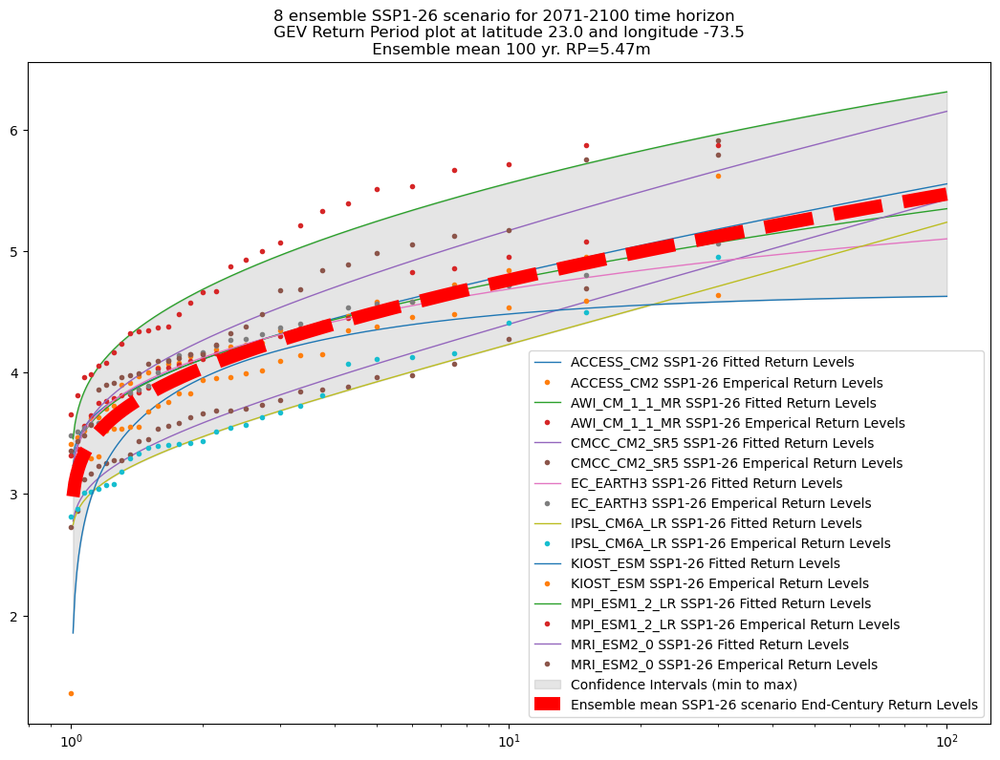

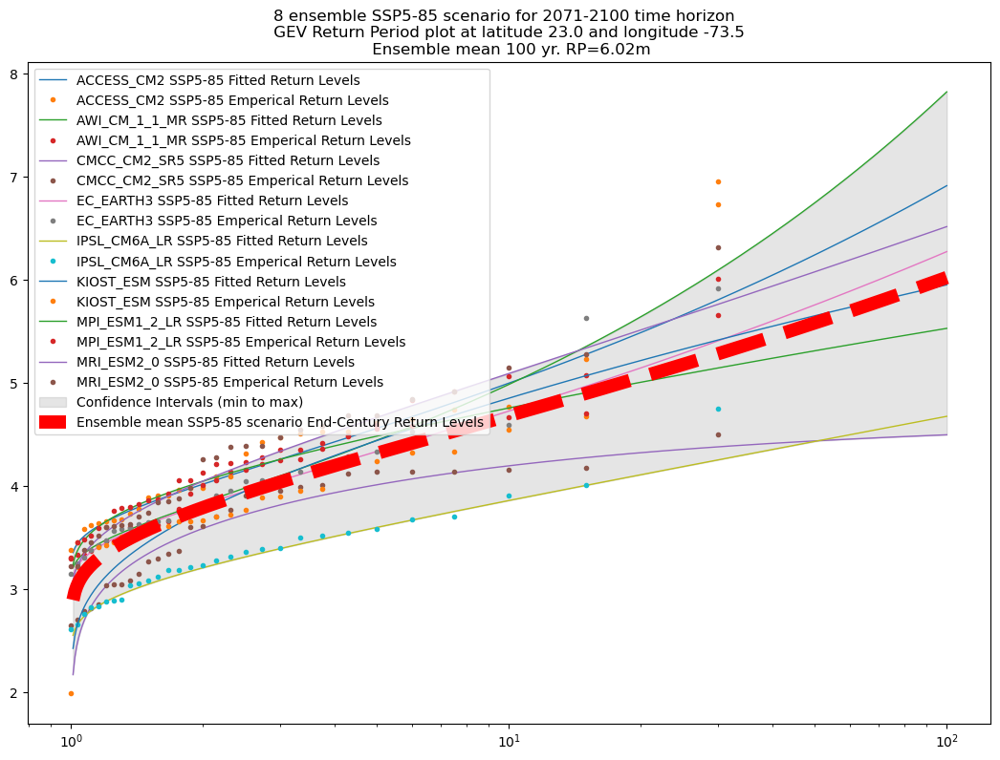

In [6]:
#Jamaica :)

latit_iter=23
longit_iter=286.5
for Annual_max_30yrs in Annual_max_30yrs_all:
        
#Get hs info from selected point
    ann_max=Annual_max_30yrs.sel(latitude=latit_iter,longitude=longit_iter)


    lat=ann_max.latitude.values+0
    lon=ann_max.longitude.values+0

    start_yr=np.datetime64(Annual_max_30yrs.time.values.min(), 'Y').astype(str).astype(int)
    end_yr=np.datetime64(Annual_max_30yrs.time.values.max(), 'Y').astype(str).astype(int)

    for scen in ["hs_1_26","hs_5_85"]:


        idx=0
        actual_levels_all=[]
        empiricalx=[]
        empiricaly=[]
        scenario_all=[]
        GCM_all=[]


        #Get emiprical and fitted values from each GCM, Scenario and Horizon and store them in blahblah_all
        for var in list(Annual_max_30yrs.data_vars.keys()):
            if scen not in var:
                continue
            

            
            if scen == "hs_1_26":
                GCM=var.replace("hs_1_26_","")
                scenario=var.replace("hs_1_26_","SSP1-26").replace(GCM,"")
            
            else:
                GCM=var.replace("hs_5_85_","")
                scenario=var.replace("hs_5_85_","SSP5-85").replace(GCM,"")
                

            data=ann_max[var].to_numpy()
            data

            x = np.sort(data)
            # print ("Emperical annual maximas= ",x)
            y = np.arange(1, len(x) + 1)
            y_rp=((y[::-1])/len(y))**-1
            # print ("Emperical return periods =",y_rp)


            actual_param=genextreme.fit(data)
            actual_years = np.arange(0.1, 100, 0.01)
            actual_levels=genextreme.ppf(1 - 1 / actual_years, *actual_param)



            
            

            actual_levels_all.append(actual_levels)
            empiricalx.append(x)
            empiricaly.append(y_rp)
            GCM_all.append(GCM)
            scenario_all.append(scenario)

            idx+=1

        if end_yr>2080:
            horizon="End-Century"
        else:
            horizon="Mid-Century"
        
        # Derive Key values for dataframe
        actual_levels_all = np.array(actual_levels_all)
        index_100_years=np.where(np.ceil(actual_years) == 100)[0][-1]
        index_50_years=np.where(np.ceil(actual_years) == 50)[0][-1]
        index_30_years=np.where(np.ceil(actual_years) == 30)[0][-1]

        RP_30=actual_levels_all.mean(axis=0)[index_30_years]
        RP_50=actual_levels_all.mean(axis=0)[index_50_years]
        RP_100=actual_levels_all.mean(axis=0)[index_100_years]


        #plot ensemble of figures
        plt.figure(figsize=(13, 9))
        for i in range(0,len(GCM_all)):
            # plot return mean levels
            plt.plot(actual_years, actual_levels_all[i], linewidth=1,label=f'{GCM_all[i]} {scenario_all[i]} Fitted Return Levels')
            # find empirical return levels
            plt.plot(empiricaly[i], empiricalx[i], 'o', markersize=3, label=f'{GCM_all[i]} {scenario_all[i]} Emperical Return Levels')

        plt.fill_between(actual_years, np.quantile(actual_levels_all, 0, axis=0).T, np.quantile(actual_levels_all, 1, axis=0).T, color='gray', alpha=0.2, label='Confidence Intervals (min to max)')

        plt.plot(actual_years, actual_levels_all.mean(axis=0), 'r--', linewidth=10, label=f"Ensemble mean {scenario} scenario {horizon} Return Levels")
        plt.title(f'{idx} ensemble {scenario} scenario for {start_yr}-{end_yr} time horizon  \n GEV Return Period plot at latitude {lat} and longitude {reverse_longitude_converter(lon)} \n Ensemble mean 100 yr. RP={RP_100:0.2f}m')
        plt.legend(loc="best")
        plt.xscale("log")
        plt.show()



### Factoring in different fits because of instability in GEV when there is a high slope that plateus

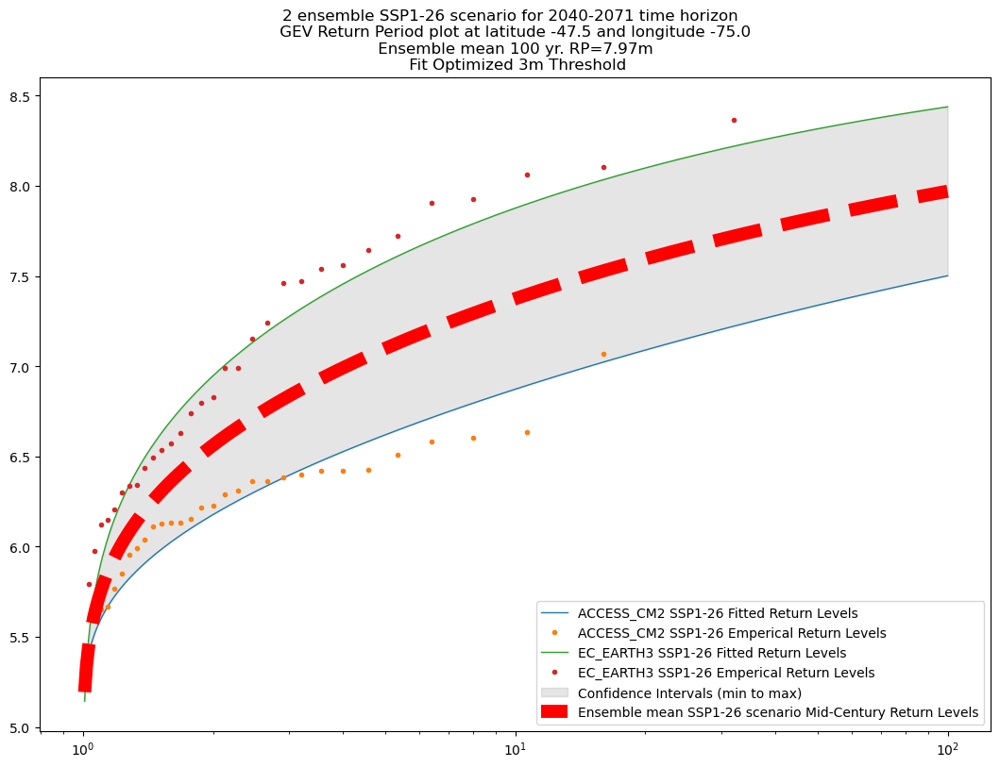

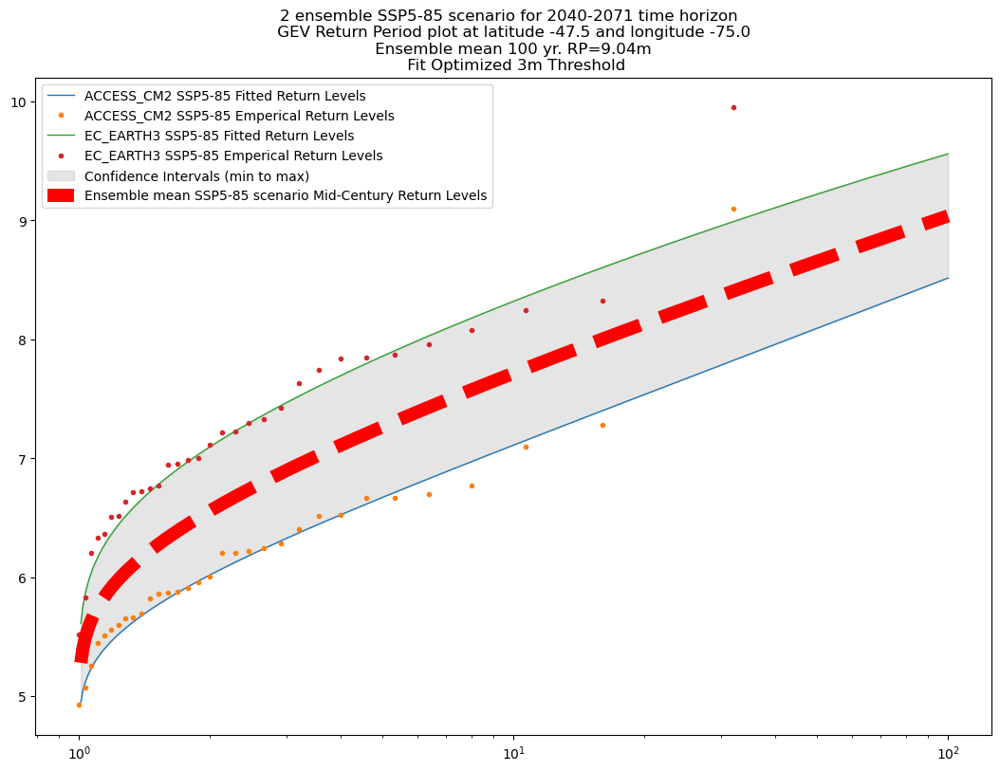

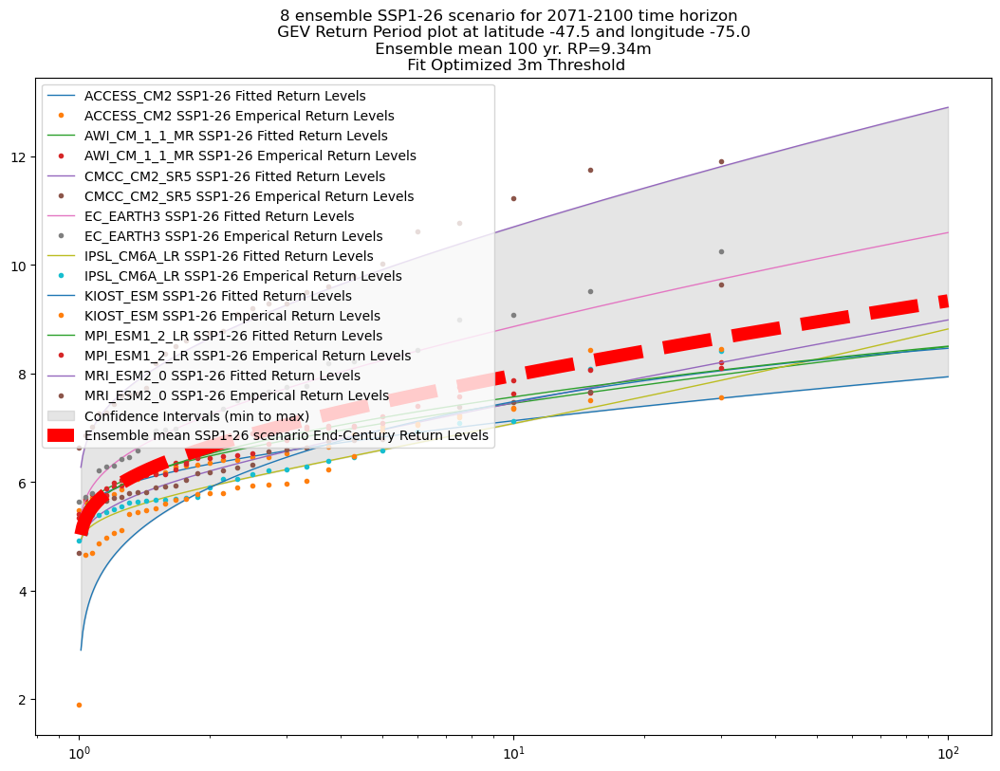

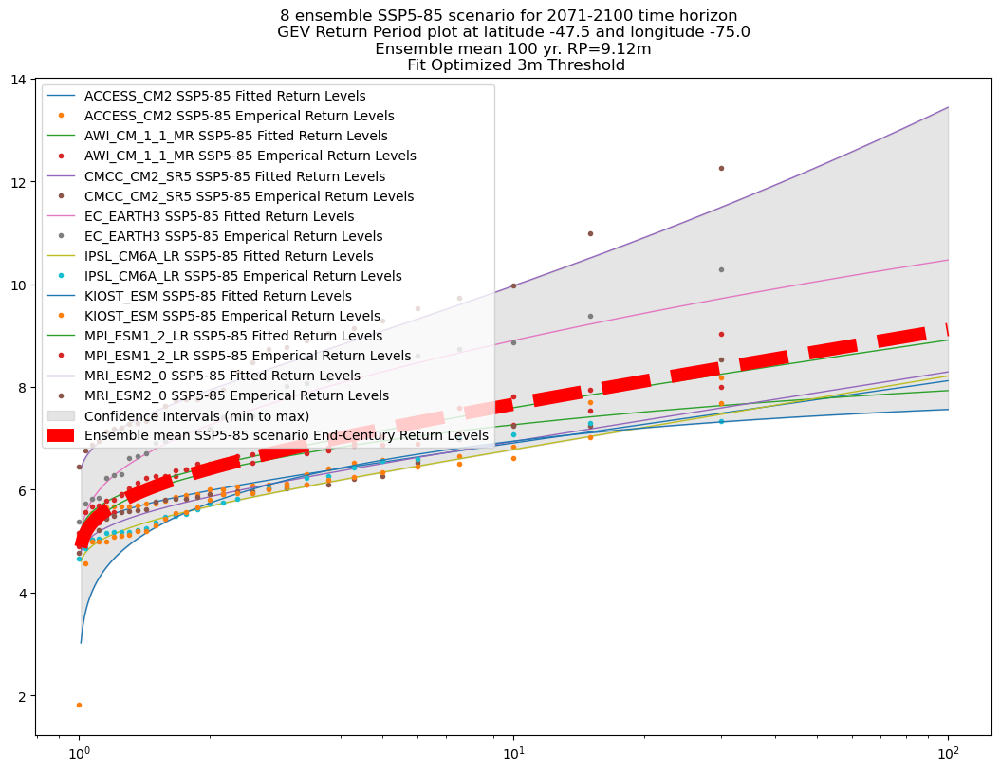

In [7]:
from scipy.stats import genextreme,weibull_min,gumbel_r,pareto

#Jamaica :)

# latit_iter=23
# longit_iter=286.5

latit_iter=-47.5
longit_iter=285.0

for Annual_max_30yrs in Annual_max_30yrs_all:
        
#Get hs info from selected point
    ann_max=Annual_max_30yrs.sel(latitude=latit_iter,longitude=longit_iter)


    lat=ann_max.latitude.values+0
    lon=ann_max.longitude.values+0

    start_yr=np.datetime64(Annual_max_30yrs.time.values.min(), 'Y').astype(str).astype(int)
    end_yr=np.datetime64(Annual_max_30yrs.time.values.max(), 'Y').astype(str).astype(int)

    for scen in ["hs_1_26","hs_5_85"]:


        idx=0
        actual_levels_all=[]
        empiricalx=[]
        empiricaly=[]
        scenario_all=[]
        GCM_all=[]


        #Get emiprical and fitted values from each GCM, Scenario and Horizon and store them in blahblah_all
        for var in list(Annual_max_30yrs.data_vars.keys()):
            if scen not in var:
                continue
            

            
            if scen == "hs_1_26":
                GCM=var.replace("hs_1_26_","")
                scenario=var.replace("hs_1_26_","SSP1-26").replace(GCM,"")
            
            else:
                GCM=var.replace("hs_5_85_","")
                scenario=var.replace("hs_5_85_","SSP5-85").replace(GCM,"")
                

            data=ann_max[var].to_numpy()
            data

            x = np.sort(data)
            # print ("Emperical annual maximas= ",x)
            y = np.arange(1, len(x) + 1)
            y_rp=((y[::-1])/len(y))**-1
            # print ("Emperical return periods =",y_rp)

# Check which fit is best 
#threshold to start switching between EVA fits is 3m difference between 31yr estimated and Bias Corrected GCM Projected
            thresh=3

# Skip if an all nan point is selected

            if np.all(np.isnan(data)):
                continue


        #Calc the return periods
            # Fit the GEV distribution to the data
            params_gev = genextreme.fit(data)
            # Fit Weibull distribution
            params_weibull = weibull_min.fit(data)
            # Fit gumbel distribution
            params_gumbel = gumbel_r.fit(data)   
            # Fit Pareto distribution
            params_pareto = pareto.fit(data) 

        #30 year return period check
            check_year=len(data)
            yr_30_gev=genextreme.isf(1/check_year, *params_gev) 
            yr_30_wei = weibull_min.isf(1/check_year, *params_weibull)
            yr_30_gum = gumbel_r.isf(1/check_year, *params_gumbel)
            yr_30_pareto = pareto.isf(1/check_year, *params_pareto)


            difference_gev=np.abs(yr_30_gev-max(data))
            difference_wei=np.abs(yr_30_wei-max(data))
            difference_gum=np.abs(yr_30_gum-max(data))
            difference_pareto=np.abs(yr_30_pareto-max(data))

            actual_years = np.arange(0.1, 100, 0.01)

            if difference_gev>thresh:
                if difference_wei<difference_gum and difference_wei<difference_pareto and difference_wei<difference_gev:
                    # Calculate return levels for Weibull distribution
                    actual_levels = weibull_min.isf(1/actual_years, *params_weibull)
                    fit_type="weibull"
                    actual_param=params_weibull
                elif difference_gum<difference_wei and difference_gum<difference_pareto and difference_gum<difference_gev:
                    # Calculate return levels for Weibull distribution
                    actual_levels = gumbel_r.isf(1/actual_years, *params_gumbel)
                    fit_type="gumbel"
                    actual_param=params_gumbel
                elif difference_pareto<difference_wei and difference_pareto<difference_gum and difference_pareto<difference_gev:
                    # Calculate return levels for Weibull distribution
                    actual_levels = pareto.isf(1/actual_years, *params_pareto)
                    fit_type="pareto"
                    actual_param =   params_pareto
                else:
                    actual_levels = genextreme.isf(1/actual_years, *params_gev)
                    fit_type="GEV"
                    actual_param=params_gev
            else:
                actual_levels = genextreme.isf(1/actual_years, *params_gev)
                fit_type="GEV" 
                actual_param=params_gev





            
            

            actual_levels_all.append(actual_levels)
            empiricalx.append(x)
            empiricaly.append(y_rp)
            GCM_all.append(GCM)
            scenario_all.append(scenario)

            idx+=1

        if end_yr>2080:
            horizon="End-Century"
        else:
            horizon="Mid-Century"
        
        # Derive Key values for dataframe
        actual_levels_all = np.array(actual_levels_all)
        index_100_years=np.where(np.ceil(actual_years) == 100)[0][-1]
        index_50_years=np.where(np.ceil(actual_years) == 50)[0][-1]
        index_30_years=np.where(np.ceil(actual_years) == 30)[0][-1]

        RP_30=actual_levels_all.mean(axis=0)[index_30_years]
        RP_50=actual_levels_all.mean(axis=0)[index_50_years]
        RP_100=actual_levels_all.mean(axis=0)[index_100_years]


        #plot ensemble of figures
        plt.figure(figsize=(13, 9))
        for i in range(0,len(GCM_all)):
            # plot return mean levels
            plt.plot(actual_years, actual_levels_all[i], linewidth=1,label=f'{GCM_all[i]} {scenario_all[i]} Fitted Return Levels')
            # find empirical return levels
            plt.plot(empiricaly[i], empiricalx[i], 'o', markersize=3, label=f'{GCM_all[i]} {scenario_all[i]} Emperical Return Levels')

        plt.fill_between(actual_years, np.quantile(actual_levels_all, 0, axis=0).T, np.quantile(actual_levels_all, 1, axis=0).T, color='gray', alpha=0.2, label='Confidence Intervals (min to max)')

        plt.plot(actual_years, actual_levels_all.mean(axis=0), 'r--', linewidth=10, label=f"Ensemble mean {scenario} scenario {horizon} Return Levels")
        plt.title(f'{idx} ensemble {scenario} scenario for {start_yr}-{end_yr} time horizon  \n GEV Return Period plot at latitude {lat} and longitude {reverse_longitude_converter(lon)} \n Ensemble mean 100 yr. RP={RP_100:0.2f}m \n Fit Optimized 3m Threshold')
        plt.legend(loc="best")
        plt.xscale("log")
        plt.show()



## Iterate for all interested points no plots nececarry

In [8]:
df_unique_final=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_wave_height\ERA5 Nearshore Mapping\Step1- Node to transect\Unique_Points_no_nan_GCM_2014.csv")
df_unique_final.dropna(subset=["lat"], inplace=True) #drop nans
df_unique_final

,lat,lon,lat_lon
0,-50.5,284.5,"(-50.5, 284.5)"
1,-47.5,285.0,"(-47.5, 285.0)"
2,-48.5,284.5,"(-48.5, 284.5)"
3,-49.0,284.5,"(-49.0, 284.5)"
4,-53.5,286.0,"(-53.5, 286.0)"
...,...,...,...
5537,64.0,37.5,"(64.0, 37.5)"
5538,65.0,37.5,"(65.0, 37.5)"
5539,65.0,37.0,"(65.0, 37.0)"
5540,64.5,36.5,"(64.5, 36.5)"


In [9]:
df_unique_final["indexa"]=df_unique_final.index
df_unique_final["lat_lon"]=list(zip(df_unique_final["lat"],df_unique_final["lon"])) #change from string to tuple due to read_csv

df_unique_final

,lat,lon,lat_lon,indexa
0,-50.5,284.5,"(-50.5, 284.5)",0
1,-47.5,285.0,"(-47.5, 285.0)",1
2,-48.5,284.5,"(-48.5, 284.5)",2
3,-49.0,284.5,"(-49.0, 284.5)",3
4,-53.5,286.0,"(-53.5, 286.0)",4
...,...,...,...,...
5537,64.0,37.5,"(64.0, 37.5)",5537
5538,65.0,37.5,"(65.0, 37.5)",5538
5539,65.0,37.0,"(65.0, 37.0)",5539
5540,64.5,36.5,"(64.5, 36.5)",5540


In [10]:
# df_unique_final["indexa"]=df_unique_final.index
# df_unique_final["lat_lon"]=list(zip(df_unique_final["lat"],df_unique_final["lon"])) #change from string to tuple due to read_csv

# df_unique_final["30_yr_RP 2050 SSP1-26 Ensemble mean"]=np.nan
# df_unique_final["50_yr_RP 2050 SSP1-26 Ensemble mean"]=np.nan
# df_unique_final["100_yr_RP 2050 SSP1-26 Ensemble mean"]=np.nan
# df_unique_final["30_yr_RP 2050 SSP5-85 Ensemble mean"]=np.nan
# df_unique_final["50_yr_RP 2050 SSP5-85 Ensemble mean"]=np.nan
# df_unique_final["100_yr_RP 2050 SSP5-85 Ensemble mean"]=np.nan
# df_unique_final["30_yr_RP 2100 SSP1-26 Ensemble mean"]=np.nan
# df_unique_final["50_yr_RP 2100 SSP1-26 Ensemble mean"]=np.nan
# df_unique_final["100_yr_RP 2100 SSP1-26 Ensemble mean"]=np.nan
# df_unique_final["30_yr_RP 2100 SSP5-85 Ensemble mean"]=np.nan
# df_unique_final["50_yr_RP 2100 SSP5-85 Ensemble mean"]=np.nan
# df_unique_final["100_yr_RP 2100 SSP5-85 Ensemble mean"]=np.nan

In [12]:
from scipy.stats import genextreme,weibull_min,gumbel_r,pareto

#threshold to start switching between EVA fits is 3m difference between 31yr estimated and Bias Corrected GCM Projected
thresh=1000


########################################
    #  Transect Location iteration  #
########################################
for row ,(latit_iter,longit_iter) in tqdm(enumerate(df_unique_final["lat_lon"]),desc="Points calculated"):
    #this is done to ensure that the fit type doesnt change with different scenarios or time horizons
    # if row < 4614:
    #     continue
    Fit_type_known=False



    ########################################
            #  Time Horizon iteration  #
    ########################################
    for Annual_max_30yrs in Annual_max_30yrs_all:
            
    #Get hs info from selected point
        ann_max=Annual_max_30yrs.sel(latitude=latit_iter,longitude=longit_iter)


        lat=ann_max.latitude.values+0
        lon=ann_max.longitude.values+0

        start_yr=np.datetime64(Annual_max_30yrs.time.values.min(), 'Y').astype(str).astype(int)
        end_yr=np.datetime64(Annual_max_30yrs.time.values.max(), 'Y').astype(str).astype(int)

        ########################################
                #  Scenario iteration  #
        ########################################
        for scen in ["hs_1_26","hs_5_85"]:


            idx=0
            actual_levels_all=[]
            empiricalx=[]
            empiricaly=[]
            scenario_all=[]
            GCM_all=[]
            fit_type_all=[]

            ########################################
                    #  Variable iteration  #
            ########################################
            #Get emiprical and fitted values from each GCM, Scenario and Horizon and store them in blahblah_all
            for var in list(Annual_max_30yrs.data_vars.keys()):


                if not Fit_type_known:
                    fit_type="Unknown yet first iter"




                if scen not in var:
                    continue
                

                
                if scen == "hs_1_26":
                    GCM=var.replace("hs_1_26_","")
                    scenario=var.replace("hs_1_26_","SSP1-26").replace(GCM,"")
                
                else:
                    GCM=var.replace("hs_5_85_","")
                    scenario=var.replace("hs_5_85_","SSP5-85").replace(GCM,"")
                    

                data=ann_max[var].to_numpy()
                data

                x = np.sort(data)
                # print ("Emperical annual maximas= ",x)
                y = np.arange(1, len(x) + 1)
                y_rp=((y[::-1])/len(y))**-1
                # print ("Emperical return periods =",y_rp)

    # Check which fit is best 


    # Skip if an all nan point is selected

                if np.all(np.isnan(data)):
                    # print(f"{scenario},{GCM} all nan")
                    continue
            #Remove nan in the weird situation one of the annual maxima is a nan.. weird right row # 4614
                data=data[~np.isnan(data)]
                
            #Calc the return periods
                # Fit the GEV distribution to the data
                params_gev = genextreme.fit(data)
                # Fit Weibull distribution
                params_weibull = weibull_min.fit(data)
                # Fit gumbel distribution
                params_gumbel = gumbel_r.fit(data)   
                # Fit Pareto distribution
                params_pareto = pareto.fit(data) 

            #30 year return period check
                check_year=len(data)
                yr_30_gev=genextreme.isf(1/check_year, *params_gev) 
                yr_30_wei = weibull_min.isf(1/check_year, *params_weibull)
                yr_30_gum = gumbel_r.isf(1/check_year, *params_gumbel)
                yr_30_pareto = pareto.isf(1/check_year, *params_pareto)


                difference_gev=np.abs(yr_30_gev-max(data))
                difference_wei=np.abs(yr_30_wei-max(data))
                difference_gum=np.abs(yr_30_gum-max(data))
                difference_pareto=np.abs(yr_30_pareto-max(data))

                actual_years = np.arange(0.1, 100, 0.01)

                if difference_gev>thresh:
                    if difference_wei<difference_gum and difference_wei<difference_pareto and difference_wei<difference_gev or fit_type== "weibull":
                        # Calculate return levels for Weibull distribution
                        actual_levels = weibull_min.isf(1/actual_years, *params_weibull)
                        fit_type="weibull"
                        actual_param=params_weibull
                    elif difference_gum<difference_wei and difference_gum<difference_pareto and difference_gum<difference_gev or fit_type== "gumbel":
                        # Calculate return levels for Weibull distribution
                        actual_levels = gumbel_r.isf(1/actual_years, *params_gumbel)
                        fit_type="gumbel"
                        actual_param=params_gumbel
                    elif difference_pareto<difference_wei and difference_pareto<difference_gum and difference_pareto<difference_gev or fit_type== "pareto":
                        # Calculate return levels for Weibull distribution
                        actual_levels = pareto.isf(1/actual_years, *params_pareto)
                        fit_type="pareto"
                        actual_param =   params_pareto
                    else:
                        actual_levels = genextreme.isf(1/actual_years, *params_gev)
                        fit_type="GEV"
                        actual_param=params_gev
                else:
                    actual_levels = genextreme.isf(1/actual_years, *params_gev)
                    fit_type="GEV" 
                    actual_param=params_gev

                # now we know the fit type
                Fit_type_known=True


                
                

                actual_levels_all.append(actual_levels)
                empiricalx.append(x)
                empiricaly.append(y_rp)
                GCM_all.append(GCM)
                scenario_all.append(scenario)

                idx+=1

            if end_yr>2080:
                horizon=2100
            else:
                horizon=2050
            
            if len(actual_levels_all)>0:    
                # Derive Key values for dataframe
                actual_levels_all = np.array(actual_levels_all)
                index_100_years=np.where(np.ceil(actual_years) == 100)[0][-1]
                index_5_years=np.where(np.ceil(actual_years) == 5)[0][-1]
                # index_30_years=np.where(np.ceil(actual_years) == 30)[0][-1]

                # RP_30=actual_levels_all.mean(axis=0)[index_30_years]
                RP_5=actual_levels_all.mean(axis=0)[index_5_years]
                RP_100=actual_levels_all.mean(axis=0)[index_100_years]
            else:
                # RP_30=np.nan
                # RP_50=np.nan
                RP_100=np.nan

            # df_unique_final.loc[df_unique_final.index==row,"30_yr_RP "+ str(horizon) +" "+ scenario +" Ensemble mean"]=RP_30
            df_unique_final.loc[df_unique_final.index==row,"5_yr_RP "+ str(horizon) +" "+ scenario +" Ensemble mean"]=RP_5
            df_unique_final.loc[df_unique_final.index==row,"100_yr_RP "+ str(horizon)+" "+ scenario +" Ensemble mean"]=RP_100


df_unique_final



Points calculated: 142it [06:08,  2.41s/it]c:\Users\rowe\AppData\Local\miniconda3\envs\coclico\Lib\site-packages\scipy\stats\_continuous_distns.py:2514: RuntimeWarning: overflow encountered in power
  return np.log(c) + sc.xlogy(c - 1, x) - pow(x, c)
Points calculated: 342it [14:30,  2.33s/it]c:\Users\rowe\AppData\Local\miniconda3\envs\coclico\Lib\site-packages\scipy\stats\_continuous_distns.py:7806: RuntimeWarning: divide by zero encountered in divide
  return ndata / np.sum(np.log((data - location) / scale))
c:\Users\rowe\AppData\Local\miniconda3\envs\coclico\Lib\site-packages\scipy\stats\_continuous_distns.py:7829: RuntimeWarning: invalid value encountered in scalar subtract
  return dL_dLocation(shape, location) - dL_dScale(shape, scale)
Points calculated: 2549it [1:50:58,  2.41s/it]c:\Users\rowe\AppData\Local\miniconda3\envs\coclico\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwar

,lat,lon,lat_lon,indexa,5_yr_RP 2050 SSP1-26 Ensemble mean,100_yr_RP 2050 SSP1-26 Ensemble mean,5_yr_RP 2050 SSP5-85 Ensemble mean,100_yr_RP 2050 SSP5-85 Ensemble mean,5_yr_RP 2100 SSP1-26 Ensemble mean,100_yr_RP 2100 SSP1-26 Ensemble mean,5_yr_RP 2100 SSP5-85 Ensemble mean,100_yr_RP 2100 SSP5-85 Ensemble mean
0,-50.5,284.5,"(-50.5, 284.5)",0,9.235696,10.848664,9.205660,10.857298,9.462179,11.293550,9.112511,10.834784
1,-47.5,285.0,"(-47.5, 285.0)",1,7.098120,7.969755,7.265046,9.037130,7.472398,9.339828,7.182214,9.118232
2,-48.5,284.5,"(-48.5, 284.5)",2,7.095524,8.200745,7.212777,8.880472,7.309570,9.644766,6.976577,8.338724
3,-49.0,284.5,"(-49.0, 284.5)",3,5.230256,5.782305,5.285869,5.965641,5.405779,6.295674,5.214451,5.973655
4,-53.5,286.0,"(-53.5, 286.0)",4,8.919286,11.075015,8.533204,10.152154,8.941104,10.645284,9.122458,10.860537
...,...,...,...,...,...,...,...,...,...,...,...,...
5537,64.0,37.5,"(64.0, 37.5)",5537,2.846141,NaN,2.846141,NaN,2.846141,NaN,2.846141,NaN
5538,65.0,37.5,"(65.0, 37.5)",5538,2.846141,NaN,2.846141,NaN,2.846141,NaN,2.846141,NaN
5539,65.0,37.0,"(65.0, 37.0)",5539,2.846141,NaN,2.846141,NaN,2.846141,NaN,2.846141,NaN
5540,64.5,36.5,"(64.5, 36.5)",5540,2.846141,NaN,2.846141,NaN,2.846141,NaN,2.846141,NaN


In [13]:
df_unique_final.head(20)

,lat,lon,lat_lon,indexa,5_yr_RP 2050 SSP1-26 Ensemble mean,100_yr_RP 2050 SSP1-26 Ensemble mean,5_yr_RP 2050 SSP5-85 Ensemble mean,100_yr_RP 2050 SSP5-85 Ensemble mean,5_yr_RP 2100 SSP1-26 Ensemble mean,100_yr_RP 2100 SSP1-26 Ensemble mean,5_yr_RP 2100 SSP5-85 Ensemble mean,100_yr_RP 2100 SSP5-85 Ensemble mean
0,-50.5,284.5,"(-50.5, 284.5)",0,9.235696,10.848664,9.205660,10.857298,9.462179,11.293550,9.112511,10.834784
1,-47.5,285.0,"(-47.5, 285.0)",1,7.098120,7.969755,7.265046,9.037130,7.472398,9.339828,7.182214,9.118232
2,-48.5,284.5,"(-48.5, 284.5)",2,7.095524,8.200745,7.212777,8.880472,7.309570,9.644766,6.976577,8.338724
3,-49.0,284.5,"(-49.0, 284.5)",3,5.230256,5.782305,5.285869,5.965641,5.405779,6.295674,5.214451,5.973655
4,-53.5,286.0,"(-53.5, 286.0)",4,8.919286,11.075015,8.533204,10.152154,8.941104,10.645284,9.122458,10.860537
5,-54.0,286.5,"(-54.0, 286.5)",5,9.939208,12.097874,9.581254,11.011092,9.992191,12.505977,10.267566,12.077426
6,-54.5,288.0,"(-54.5, 288.0)",6,5.581698,6.525938,5.533433,6.456293,5.689053,6.883282,5.819296,6.812239
7,-52.5,285.0,"(-52.5, 285.0)",7,10.184742,12.227162,9.773390,11.628170,10.028189,11.514130,10.057473,11.931618
8,-50.0,284.5,"(-50.0, 284.5)",8,8.797808,10.521371,8.769950,10.030585,9.035008,11.190154,8.653411,10.453390
9,-47.5,285.5,"(-47.5, 285.5)",9,5.370364,6.137233,5.512119,7.108627,5.801616,7.362070,5.552187,7.295473


In [21]:
# Plot using Plotly Express
fig = px.scatter_mapbox(df_unique_final,
                        lat='lat',
                        lon='lon',
                        color="5_yr_RP 2100 SSP5-85 Ensemble mean",
                        hover_data="5_yr_RP 2100 SSP5-85 Ensemble mean",
                        mapbox_style="carto-positron")

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat, lon=lon), zoom=0.2))
fig.show()

Save Global Node Values

In [15]:
df_unique_final.to_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\02_Future\Extreme_wave_height\GCM Nearshore Mapping\Step 5- Calculating the RP at all global bias corrected GCM nodes-GEV_only\Nodes_GCM_from_GCM_5yr100yr_RP_GEV_only.csv",index=False)

In [2]:
df_final=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_wave_height\ERA5 Nearshore Mapping\Step1- Node to transect\All_Transects_GCMmap_2014_zip_added.csv")
df_final

,Unnamed: 0,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,near_lat,near_lon,Lat_Lon
0,0,BOX_028_183_0,CHL,South America,Chile,-74.386310,-50.377659,-74.390966,-50.382558,-74.395623,-50.387456,-50.5,284.5,"(-50.5, 284.5)"
1,1,BOX_028_183_1,CHL,South America,Chile,-74.382469,-50.379144,-74.387125,-50.384042,-74.391782,-50.388940,-50.5,284.5,"(-50.5, 284.5)"
2,2,BOX_028_183_2,CHL,South America,Chile,-74.378628,-50.380629,-74.383284,-50.385527,-74.387941,-50.390425,-50.5,284.5,"(-50.5, 284.5)"
3,3,BOX_028_183_3,CHL,South America,Chile,-74.373950,-50.382583,-74.379517,-50.387079,-74.385083,-50.391574,-50.5,284.5,"(-50.5, 284.5)"
4,4,BOX_028_183_4,CHL,South America,Chile,-74.370425,-50.384358,-74.375991,-50.388853,-74.381558,-50.393348,-50.5,284.5,"(-50.5, 284.5)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739821,1739821,BOX_211_067_149,RUS,Europe,Russia,39.929937,64.701462,39.935198,64.698350,39.940460,64.695238,66.5,41.0,"(66.5, 41.0)"
1739822,1739822,BOX_211_067_150,RUS,Europe,Russia,39.933577,64.702586,39.938839,64.699474,39.944100,64.696363,66.5,41.0,"(66.5, 41.0)"
1739823,1739823,BOX_211_067_151,RUS,Europe,Russia,39.935546,64.703502,39.942003,64.700833,39.948460,64.698164,66.5,41.0,"(66.5, 41.0)"
1739824,1739824,BOX_211_067_152,RUS,Europe,Russia,39.937050,64.704370,39.944697,64.702356,39.952343,64.700341,66.5,41.0,"(66.5, 41.0)"


In [4]:
df_unique_final=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\02_Future\Extreme_wave_height\GCM Nearshore Mapping\Step 5- Calculating the RP at all global bias corrected GCM nodes-GEV_only\Nodes_GCM_from_GCM_5yr100yr_RP_GEV_only.csv")
df_unique_final

,lat,lon,lat_lon,indexa,5_yr_RP 2050 SSP1-26 Ensemble mean,100_yr_RP 2050 SSP1-26 Ensemble mean,5_yr_RP 2050 SSP5-85 Ensemble mean,100_yr_RP 2050 SSP5-85 Ensemble mean,5_yr_RP 2100 SSP1-26 Ensemble mean,100_yr_RP 2100 SSP1-26 Ensemble mean,5_yr_RP 2100 SSP5-85 Ensemble mean,100_yr_RP 2100 SSP5-85 Ensemble mean
0,-50.5,284.5,"(-50.5, 284.5)",0,9.235696,10.848664,9.205660,10.857298,9.462179,11.293550,9.112511,10.834784
1,-47.5,285.0,"(-47.5, 285.0)",1,7.098120,7.969755,7.265046,9.037130,7.472398,9.339828,7.182214,9.118232
2,-48.5,284.5,"(-48.5, 284.5)",2,7.095524,8.200745,7.212777,8.880472,7.309570,9.644766,6.976577,8.338724
3,-49.0,284.5,"(-49.0, 284.5)",3,5.230256,5.782305,5.285869,5.965641,5.405779,6.295674,5.214451,5.973655
4,-53.5,286.0,"(-53.5, 286.0)",4,8.919286,11.075015,8.533204,10.152154,8.941104,10.645284,9.122458,10.860537
...,...,...,...,...,...,...,...,...,...,...,...,...
5536,64.0,37.5,"(64.0, 37.5)",5537,2.846141,NaN,2.846141,NaN,2.846141,NaN,2.846141,NaN
5537,65.0,37.5,"(65.0, 37.5)",5538,2.846141,NaN,2.846141,NaN,2.846141,NaN,2.846141,NaN
5538,65.0,37.0,"(65.0, 37.0)",5539,2.846141,NaN,2.846141,NaN,2.846141,NaN,2.846141,NaN
5539,64.5,36.5,"(64.5, 36.5)",5540,2.846141,NaN,2.846141,NaN,2.846141,NaN,2.846141,NaN


Merge Global Node Values to Global transects to Map/"Downscale" Offshore waveheights

In [5]:
df_final_merged = pd.merge(left=df_final, right=df_unique_final, left_on="Lat_Lon", right_on="lat_lon")
df_final_merged


,Unnamed: 0,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,...,lat_lon,indexa,5_yr_RP 2050 SSP1-26 Ensemble mean,100_yr_RP 2050 SSP1-26 Ensemble mean,5_yr_RP 2050 SSP5-85 Ensemble mean,100_yr_RP 2050 SSP5-85 Ensemble mean,5_yr_RP 2100 SSP1-26 Ensemble mean,100_yr_RP 2100 SSP1-26 Ensemble mean,5_yr_RP 2100 SSP5-85 Ensemble mean,100_yr_RP 2100 SSP5-85 Ensemble mean
0,0,BOX_028_183_0,CHL,South America,Chile,-74.386310,-50.377659,-74.390966,-50.382558,-74.395623,...,"(-50.5, 284.5)",0,9.235696,10.848664,9.20566,10.857298,9.462179,11.29355,9.112511,10.834784
1,1,BOX_028_183_1,CHL,South America,Chile,-74.382469,-50.379144,-74.387125,-50.384042,-74.391782,...,"(-50.5, 284.5)",0,9.235696,10.848664,9.20566,10.857298,9.462179,11.29355,9.112511,10.834784
2,2,BOX_028_183_2,CHL,South America,Chile,-74.378628,-50.380629,-74.383284,-50.385527,-74.387941,...,"(-50.5, 284.5)",0,9.235696,10.848664,9.20566,10.857298,9.462179,11.29355,9.112511,10.834784
3,3,BOX_028_183_3,CHL,South America,Chile,-74.373950,-50.382583,-74.379517,-50.387079,-74.385083,...,"(-50.5, 284.5)",0,9.235696,10.848664,9.20566,10.857298,9.462179,11.29355,9.112511,10.834784
4,4,BOX_028_183_4,CHL,South America,Chile,-74.370425,-50.384358,-74.375991,-50.388853,-74.381558,...,"(-50.5, 284.5)",0,9.235696,10.848664,9.20566,10.857298,9.462179,11.29355,9.112511,10.834784
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739176,1739601,BOX_211_028_75,RUS,Europe,Russia,37.599721,64.363515,37.595273,64.360138,37.590824,...,"(64.5, 37.5)",5541,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1739177,1739602,BOX_211_028_76,RUS,Europe,Russia,37.603623,64.362553,37.599175,64.359176,37.594726,...,"(64.5, 37.5)",5541,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1739178,1739603,BOX_211_028_77,RUS,Europe,Russia,37.607526,64.361590,37.603077,64.358213,37.598628,...,"(64.5, 37.5)",5541,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1739179,1739604,BOX_211_028_78,RUS,Europe,Russia,37.611428,64.360628,37.606979,64.357251,37.602530,...,"(64.5, 37.5)",5541,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
import plotly.express as px

lat = 18.1
lon = -77.3
view_width = 10

# Filter dataframe within specified range
filtered_df = df_final_merged[
    (df_final_merged["Intersect_lon"] < lon + 18) & 
    (df_final_merged["Intersect_lon"] > lon - 7.5) & 
    (df_final_merged["Intersect_lat"] < lat + 9) & 
    (df_final_merged["Intersect_lat"] > lat - 8)
]

# Plot using Plotly Express
fig = px.scatter_mapbox(filtered_df,
                        lat='Intersect_lat',
                        lon='Intersect_lon',
                        color="5_yr_RP 2050 SSP1-26 Ensemble mean",
                        hover_data="5_yr_RP 2050 SSP1-26 Ensemble mean",
                        mapbox_style="carto-positron",width=1000,
                        height=600)

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat+1, lon=lon+4), zoom=4),title="100 yr Wave_Height Return-Period Distribution along Caribbean's shoreline")
fig.show()

In [7]:
df_final_merged.to_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\02_Future\Extreme_wave_height\GCM Nearshore Mapping\Step 5- Calculating the RP at all global bias corrected GCM nodes-GEV_only\Global_Transects_GCM_FC_from_GCM_5yr100yr_RP_GEV_only.csv",index=False)